In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
from torch.utils.data import Dataset, DataLoader, random_split
import matplotlib.pyplot as plt
import time
import os
from PIL import Image
import math

In [2]:
torch.cuda.empty_cache()

In [22]:
train_dir = r"C:\Users\Vikash kumar singh\Desktop\New folder\cynaptics_induc\induction-task\ai-real-classify\data"
test_dir = r"C:\Users\Vikash kumar singh\Desktop\New folder\cynaptics_induc\induction-task\ai-real-classify\induction-task-2025\Test_Images"

In [23]:
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [24]:
test_transform = transforms.Compose([
    transforms.Resize([224,224]),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [25]:
class TestDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.image_paths = [os.path.join(root_dir, fname) for fname in os.listdir(root_dir) if fname.endswith(('.png', '.jpg', '.jpeg'))]
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, img_path

In [26]:
train_dataset = datasets.ImageFolder(root=train_dir, transform=train_transform)
test_dataset = TestDataset(root_dir=test_dir,transform=test_transform)

In [27]:
train_size = math.floor(0.8 * len(train_dataset))  
val_size = len(train_dataset) - train_size  

train_subset, val_subset = random_split(train_dataset, [train_size, val_size])

In [28]:
train_loader = DataLoader(train_subset, batch_size=64, shuffle=True)
val_loader = DataLoader(val_subset, batch_size=64, shuffle=False)
test_loader = DataLoader(test_dataset,batch_size=64,shuffle=False)

In [29]:
class_names = train_dataset.classes
class_names

['AI', 'Real']

In [30]:
train_size = len(train_subset)
val_size = len(val_subset)
test_size = len(test_dataset)

print(train_size,val_size,test_size)

1319 330 200


In [31]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

In [40]:
vgg16 = models.vgg16(weights='VGG16_Weights.IMAGENET1K_V1')

for param in vgg16.features.parameters():
    param.requires_grad = False

vgg16.classifier[6] = nn.Linear(in_features=4096, out_features=2)
vgg16 = vgg16.to(device)

criterion = nn.CrossEntropyLoss()

optimizer = optim.Adam(vgg16.classifier.parameters(), lr=0.001)

exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=4, gamma=0.5)


In [33]:
import os
import time
import torch

def train_model(model, criterion, optimizer, scheduler, num_epochs, train_loader, val_loader, device):
    since = time.time()

    save_dir = "./saved_models"
    os.makedirs(save_dir, exist_ok=True)
    best_model_params_path = os.path.join(save_dir, 'best_model_params_vgg16.pt')

    best_acc = 0.0

    for epoch in range(num_epochs):
        print(f'Epoch {epoch}/{num_epochs - 1}')

        model.train()
        train_loss = 0.0
        train_corrects = 0

        for inputs, labels in train_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)

            loss.backward()
            optimizer.step()

            train_loss += loss.item() * inputs.size(0)
            train_corrects += torch.sum(preds == labels.data)

        train_loss = train_loss / len(train_loader.dataset)
        train_acc = train_corrects.double() / len(train_loader.dataset)

        print(f'Train Loss: {train_loss:.4f} Acc: {train_acc:.4f}')

        model.eval()
        val_loss = 0.0
        val_corrects = 0

        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs = inputs.to(device)
                labels = labels.to(device)

                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * inputs.size(0)
                val_corrects += torch.sum(preds == labels.data)

        val_loss = val_loss / len(val_loader.dataset)
        val_acc = val_corrects.double() / len(val_loader.dataset)

        print(f'Val Loss: {val_loss:.4f} Acc: {val_acc:.4f}')

        scheduler.step(val_loss)  

        if val_acc > best_acc:
            best_acc = val_acc
            torch.save(model.state_dict(), best_model_params_path)
            print(f' model saved')

        time_elapsed = time.time() - since
        print(f'Epoch time: {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

    torch.save(model.state_dict(),"model_params_vgg16.pt")
    print(f'Best validation accuracy: {best_acc:.4f}')

    return model

In [34]:
model_ft = train_model(vgg16, criterion, optimizer, exp_lr_scheduler,num_epochs=10,train_loader=train_loader,val_loader=val_loader
                       ,device=device)

Epoch 0/9
Train Loss: 0.7703 Acc: 0.7627
Val Loss: 0.3759 Acc: 0.8364


c:\Users\Vikash kumar singh\anaconda_\Lib\site-packages\torch\optim\lr_scheduler.py:232: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


 model saved
Epoch time: 4m 34s
Epoch 1/9
Train Loss: 0.4533 Acc: 0.8431
Val Loss: 0.3604 Acc: 0.8424
 model saved
Epoch time: 9m 13s
Epoch 2/9
Train Loss: 0.3030 Acc: 0.8772
Val Loss: 0.4101 Acc: 0.8606
 model saved
Epoch time: 13m 47s
Epoch 3/9
Train Loss: 0.3314 Acc: 0.8870
Val Loss: 0.4475 Acc: 0.8515
Epoch time: 18m 50s
Epoch 4/9
Train Loss: 0.3095 Acc: 0.8893
Val Loss: 0.4654 Acc: 0.8424
Epoch time: 23m 32s
Epoch 5/9
Train Loss: 0.2626 Acc: 0.8916
Val Loss: 0.4172 Acc: 0.8697
 model saved
Epoch time: 27m 59s
Epoch 6/9
Train Loss: 0.2493 Acc: 0.9075
Val Loss: 0.4084 Acc: 0.8394
Epoch time: 32m 32s
Epoch 7/9
Train Loss: 0.2754 Acc: 0.9143
Val Loss: 0.6717 Acc: 0.7485
Epoch time: 37m 16s
Epoch 8/9
Train Loss: 0.2984 Acc: 0.9113
Val Loss: 0.5197 Acc: 0.8636
Epoch time: 41m 51s
Epoch 9/9
Train Loss: 0.2734 Acc: 0.9075
Val Loss: 0.6064 Acc: 0.8424
Epoch time: 46m 18s
Best validation accuracy: 0.8697


In [43]:
model = vgg16
model.load_state_dict(torch.load(r'model_params_vgg16.pt'))
model.to(device)

C:\Users\Vikash kumar singh\AppData\Local\Temp\ipykernel_20264\1898218651.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(r'model_params

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [15]:
test_dir = r"C:\Users\Vikash kumar singh\Desktop\New folder\cynaptics_induc\induction-task\ai-real-classify\induction-task-2025\test_images"
test_dataset = TestDataset(root_dir=test_dir,transform=test_transform)
test_loader = DataLoader(test_dataset,batch_size=64,shuffle=False)

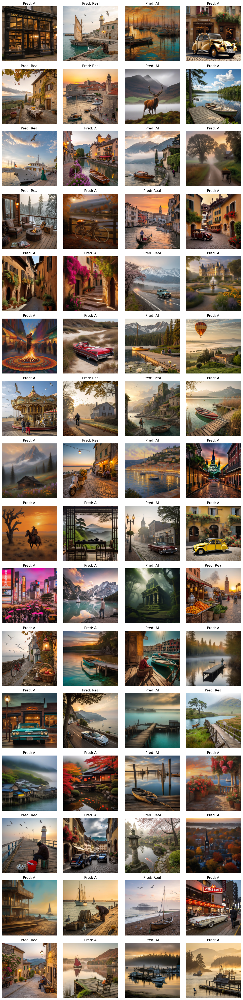

In [36]:
import matplotlib.pyplot as plt
import torch
import math

class_names = ['AI',"Real"]

def visualize_predictions(model, testloader, classes, device='cuda' if torch.cuda.is_available() else 'cpu'):
    model.eval()
    mean = torch.tensor([0.485, 0.456, 0.406])  
    std = torch.tensor([0.229, 0.224, 0.225])  
    
    with torch.no_grad():
        for images, _ in testloader:
            images = images.to(device)

            outputs = model(images)
            _, predicted = torch.max(outputs, 1)

            images = images.cpu()

            images = images * std[:, None, None] + mean[:, None, None] 
            images = torch.clamp(images, 0, 1) 

            num_images = len(images)
            cols = 4 
            rows = math.ceil(num_images / cols)

            plt.figure(figsize=(cols*3, rows*3))  
            for i in range(num_images):
                plt.subplot(rows, cols, i+1)  
                plt.imshow(images[i].permute(1, 2, 0))  
                plt.title(f'Pred: {classes[predicted[i]]}')
                plt.axis('off')
            
            plt.tight_layout()
            plt.show()
            break

visualize_predictions(model, test_loader, class_names)

In [37]:
import torch
import pandas as pd
from torch.nn.functional import softmax
import os

def generate_predictions(model, test_loader, device, output_path='predictions.csv'):
    model.eval()

    image_ids = []
    predictions = []
    
    with torch.no_grad():
        for batch in test_loader:
            if isinstance(batch, (tuple, list)):
                images = batch[0]
                if len(batch) > 1:
                    batch_ids = [os.path.splitext(os.path.basename(str(path)))[0] for path in batch[1]]
                else:
                    batch_ids = [f"image_{i}" for i in range(len(images))]
            else:
                images = batch
                batch_ids = [f"image_{i}" for i in range(len(images))]

            images = images.to(device)

            outputs = model(images)
            probs = softmax(outputs, dim=1)

            _, predicted = torch.max(outputs.data, 1)

            batch_predictions = ['AI' if pred == 0 else 'Real' for pred in predicted.cpu().numpy()]

            image_ids.extend(batch_ids)
            predictions.extend(batch_predictions)

    results_df = pd.DataFrame({
        'Id': image_ids,
        'Label': predictions
    })

    results_df.to_csv(output_path, index=False)
    print(f"Predictions saved to {output_path}")
    
    return results_df

In [44]:

model.eval()

predictions_df = generate_predictions(
    model=model,
    test_loader=test_loader,
    device=device,
    output_path='predictions.csv'
)

print("\nFirst few predictions:")
print(predictions_df.head())

Predictions saved to predictions.csv

First few predictions:
          Id Label
0    image_0  Real
1    image_1  Real
2   image_10    AI
3  image_100  Real
4  image_101  Real
